# importado de Librerias

In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Definición de funciones auxiliares

In [2]:

def ref_leer_componentes(atomo):
    '''     
    atomo : Linea de texto proveniente de un archivo refstructureFF.out de donde se extraen las componentes cartesinas a una lista [x,y,z].
    '''
    return  [float(atomo.split()[0]), float(atomo.split()[1]), float(atomo.split()[2])]


def read_trajs(path : str) -> dict:
    '''
    Esta funcion lee la direccion con las salidas de la dinamica molecular (concatenada) y las guarda en un diccionario.
    '''
    df = {}
    dfs = []
    sticks = ['traj_stick.out', 'traj_stickearly.out', 'traj_sticklate.out']
    for stick in sticks:    
        if os.path.getsize(path + stick) > 0:
            dfs.append(pd.read_csv(path + stick, delim_whitespace=True, header=None))
    if len(dfs) == 0:
        df['stick'] = dfs[0]
    if len(dfs) > 0:
        df['stick'] = pd.concat(dfs, ignore_index=True)
    del(dfs)
    df['stick'].columns = ['ncoup', 'nt', 't', 'nreb', 'nsubh', 'ptad', 'V']
    df['stick'] = df['stick'].sort_values(by='ncoup')
    df['stick'].columns = ['ncoup', 'nt', 't', 'nreb', 'nsubh', 'ptad', 'V']

    df['admol'] = pd.read_csv(path + 'traj_admol.out', delim_whitespace=True, header=None)
    df['admol'].columns = ['ncoup','nt','t','rmax','V','vint']
    df['refl'] = pd.read_csv(path + 'traj_refl.out', delim_whitespace=True, header=None)
    df['refl'].columns = ['ncoup','nt','t','nreb','V','tlf'] 
    return df

def read_CMs(path : str) -> dict:
    '''
    Esta funcion lee la direccion con las salidas de la dinamica molecular (concatenada) y las guarda en un diccionario.
    '''
    df = {}
    dfs = []
    sticks = ['traj_stick.out', 'traj_stickearly.out', 'traj_sticklate.out']
    for stick in sticks:    
        if os.path.getsize(path + stick) > 0:
            dfs.append(pd.read_csv(path + stick))
    if len(dfs) == 0:
        df['stick'] = dfs[0]
    if len(dfs) > 0:
        df['stick'] = pd.concat(dfs, ignore_index=True)
    del(dfs)
    df['admol'] = pd.read_csv(path + 'traj_admol.out')
    df['refl'] = pd.read_csv(path + 'traj_refl.out')

    return df


# Lectura de datos

In [3]:
Pt_ref = {}
with open('data/refstructureFF.out') as f:
            ref = f.readlines()


for i in range(3,54):
    Pt_ref[str(i-2)] =  ref_leer_componentes(ref[i])    

In [4]:
path50 = 'data/01 - NN15 concat MD/50Koutputs/'
path300 = 'data/01 - NN15 concat MD/300Koutputs/'
path550 = 'data/01 - NN15 concat MD/550Koutputs/'
energias =  ['Ei0.4_outputs/','Ei0.6_outputs/','Ei0.8_outputs/','Ei1.0_outputs/','Ei1.2_outputs/','Ei1.4_outputs/']

conf_files = ['config_admol.xyz',
'config_refl.xyz',
'config_stick.xyz',
'config_stickearly.xyz',
'config_sticklate.xyz']

energias =  ['Ei0.4_outputs/','Ei0.6_outputs/','Ei0.8_outputs/','Ei1.0_outputs/','Ei1.2_outputs/','Ei1.4_outputs/']
trajs50 = {}
trajs300 = {}
trajs550 = {}
for Ei in energias:
    trajs50[str(Ei[2:5])] = read_trajs(path50+Ei)
    trajs300[str(Ei[2:5])] = read_trajs(path300+Ei)
    trajs550[str(Ei[2:5])] = read_trajs(path550+Ei)
E_incidencia = ['0.4','0.6','0.8','1.0','1.2','1.4']

E_incidencia2 = ['0_4','0_6','0_8','1_0','1_2','1_4']
tipo_traj = ['stick', 'admol', 'refl']


In [5]:
def read_CMs(path : str, file : str) -> dict:
    '''
    Esta funcion lee la direccion con ... las guarda en un diccionario.
    '''
    df = {}
    dfs = []
    sticks = [f'{file}_stick_CH4_cm.out', f'{file}_stickearly_CH4_cm.out', f'{file}_sticklate_CH4_cm.out']
    for stick in sticks:
        if not os.path.exists(path + stick):
            print(f"El archivo '{stick}' no existe en la ubicación '{path}'")
            pass    
        elif os.path.getsize(path + stick) > 0:
            dfs.append(pd.read_csv(path + stick))
    if len(dfs) == 0:
        df['stick'] = dfs[0]
    if len(dfs) > 0:
        df['stick'] = pd.concat(dfs, ignore_index=True)
    del(dfs)
    df['admol'] = pd.read_csv(path + f'{file}_admol_CH4_cm.out')
    df['refl'] = pd.read_csv(path + f'{file}_refl_CH4_cm.out')

    return df

def read_dPt(path : str, file : str) -> dict:
    '''
    Esta funcion lee la direccion con ... las guarda en un diccionario.
    '''
    df = {}
    dfs = []
    sticks = [f'{file}_stick_dPt.out', f'{file}_stickearly_dPt.out', f'{file}_sticklate_dPt.out']
    for stick in sticks:
        if not os.path.exists(path + stick):
            print(f"El archivo '{stick}' no existe en la ubicación '{path}'")
            pass    
        elif os.path.getsize(path + stick) > 0:
            dfs.append(pd.read_csv(path + stick))
    if len(dfs) == 0:
        df['stick'] = dfs[0]
    if len(dfs) > 0:
        df['stick'] = pd.concat(dfs, ignore_index=True)
    del(dfs)
    df['admol'] = pd.read_csv(path + f'{file}_admol_dPt.out')
    df['refl'] = pd.read_csv(path + f'{file}_refl_dPt.out')

    return df

In [6]:
CMs50 = {}
CMs300 = {}
CMs550 = {}


for Ei,E_path in zip(E_incidencia2, energias):
    file = '50K_'+ Ei
    CMs50[Ei] = read_CMs(path50+E_path,file)

for Ei,E_path in zip(E_incidencia2, energias):
    file = '300K_'+ Ei
    CMs300[Ei] = read_CMs(path300+E_path,file)

for Ei,E_path in zip(E_incidencia2, energias):
    file = '550K_'+ Ei
    CMs550[Ei] = read_CMs(path550+E_path,file)

El archivo '50K_0_4_stickearly_CH4_cm.out' no existe en la ubicación 'data/01 - NN15 concat MD/50Koutputs/Ei0.4_outputs/'
El archivo '50K_0_6_stickearly_CH4_cm.out' no existe en la ubicación 'data/01 - NN15 concat MD/50Koutputs/Ei0.6_outputs/'


El archivo '50K_0_8_stickearly_CH4_cm.out' no existe en la ubicación 'data/01 - NN15 concat MD/50Koutputs/Ei0.8_outputs/'
El archivo '50K_1_0_stickearly_CH4_cm.out' no existe en la ubicación 'data/01 - NN15 concat MD/50Koutputs/Ei1.0_outputs/'
El archivo '50K_1_2_stickearly_CH4_cm.out' no existe en la ubicación 'data/01 - NN15 concat MD/50Koutputs/Ei1.2_outputs/'
El archivo '50K_1_4_stickearly_CH4_cm.out' no existe en la ubicación 'data/01 - NN15 concat MD/50Koutputs/Ei1.4_outputs/'
El archivo '300K_0_4_stickearly_CH4_cm.out' no existe en la ubicación 'data/01 - NN15 concat MD/300Koutputs/Ei0.4_outputs/'
El archivo '300K_0_4_sticklate_CH4_cm.out' no existe en la ubicación 'data/01 - NN15 concat MD/300Koutputs/Ei0.4_outputs/'
El archivo '300K_0_6_stickearly_CH4_cm.out' no existe en la ubicación 'data/01 - NN15 concat MD/300Koutputs/Ei0.6_outputs/'
El archivo '300K_0_8_stickearly_CH4_cm.out' no existe en la ubicación 'data/01 - NN15 concat MD/300Koutputs/Ei0.8_outputs/'
El archivo '300K_

In [7]:
CMs300['1_0']['stick']

,ntraj,x,y,z,x_ini,y_ini,z_ini
0,6,4.491808,0.068978,2.204750,4.354803,0.078828,8.999761
1,34,2.791050,6.275128,1.803352,3.031029,6.214851,9.000002
2,37,4.686536,6.763273,2.050004,4.543170,6.910747,9.000165
3,87,3.787536,7.928295,2.146122,3.782650,7.904797,9.000107
4,93,4.934592,3.304296,2.194843,4.593273,3.369621,9.000034
...,...,...,...,...,...,...,...
407,9167,3.769645,5.831052,2.398764,3.788886,5.945700,8.999861
408,9198,4.646739,3.873928,2.109358,4.475391,3.833147,9.000119
409,9595,5.259471,6.293737,1.999119,5.007316,6.245380,8.999806
410,9784,5.508937,2.300502,1.574029,5.318310,2.220762,8.999987


In [8]:
dPt50 = {}
dPt300 = {}
dPt550 = {}


for Ei,E_path in zip(E_incidencia2, energias):
    file = '50K_'+ Ei
    dPt50[Ei] = read_dPt(path50+E_path,file)

for Ei,E_path in zip(E_incidencia2, energias):
    file = '300K_'+ Ei
    dPt300[Ei] = read_dPt(path300+E_path,file)

for Ei,E_path in zip(E_incidencia2, energias):
    file = '550K_'+ Ei
    dPt550[Ei] = read_dPt(path550+E_path,file)

El archivo '50K_0_4_stickearly_dPt.out' no existe en la ubicación 'data/01 - NN15 concat MD/50Koutputs/Ei0.4_outputs/'


El archivo '50K_0_6_stickearly_dPt.out' no existe en la ubicación 'data/01 - NN15 concat MD/50Koutputs/Ei0.6_outputs/'
El archivo '50K_0_8_stickearly_dPt.out' no existe en la ubicación 'data/01 - NN15 concat MD/50Koutputs/Ei0.8_outputs/'
El archivo '50K_1_0_stickearly_dPt.out' no existe en la ubicación 'data/01 - NN15 concat MD/50Koutputs/Ei1.0_outputs/'
El archivo '50K_1_2_stickearly_dPt.out' no existe en la ubicación 'data/01 - NN15 concat MD/50Koutputs/Ei1.2_outputs/'
El archivo '50K_1_4_stickearly_dPt.out' no existe en la ubicación 'data/01 - NN15 concat MD/50Koutputs/Ei1.4_outputs/'
El archivo '300K_0_4_stickearly_dPt.out' no existe en la ubicación 'data/01 - NN15 concat MD/300Koutputs/Ei0.4_outputs/'
El archivo '300K_0_4_sticklate_dPt.out' no existe en la ubicación 'data/01 - NN15 concat MD/300Koutputs/Ei0.4_outputs/'
El archivo '300K_0_6_stickearly_dPt.out' no existe en la ubicación 'data/01 - NN15 concat MD/300Koutputs/Ei0.6_outputs/'
El archivo '300K_0_8_stickearly_dPt.out' no

In [9]:
dPt300['0_6']['stick']

,ntraj,nat,dx,dy,dz
0,91,31,0.130052,0.124337,-0.076986
1,91,32,0.024119,0.104353,0.013625
2,91,33,0.015108,0.053159,-0.171194
3,91,34,0.010152,0.079191,-0.008881
4,91,35,-0.093944,0.020393,-0.013206
...,...,...,...,...,...
1381,7415,47,-0.067174,-0.389071,-0.025784
1382,7415,48,0.031248,-0.377185,-0.011608
1383,7415,49,0.030205,-0.587078,-0.037893
1384,7415,50,-0.095663,-0.425242,0.010563


In [10]:
trajs300['0.6']['stick']

,ncoup,nt,t,nreb,nsubh,ptad,V
0,91,1341,0.2680,1,1,49,1.755200
1,196,1451,0.2900,0,4,49,2.000800
2,235,1348,0.2694,1,4,50,1.625708
56,631,1337,0.2672,1,2,50,1.880406
3,1290,1275,0.2548,0,2,49,1.947462
...,...,...,...,...,...,...,...
51,9032,1196,0.2390,0,3,50,2.164315
52,9287,1306,0.2610,0,1,49,1.877633
53,9388,1350,0.2698,1,2,50,1.973322
54,9550,1353,0.2704,0,2,50,1.656738


# Armado de Gráficas

## Armado de canvas

In [11]:
X_canvas = []
Y_canvas = []
color_canvas = []
X_periodic = 8.04
Y_periodic = 8.5277077811
for i in range(37,52):
    for a in [-4,-3,-2,-1,0,1,2,3,4]:
        for b in [-2,-1,0,1,2]:
            X_canvas.append(Pt_ref[str(i)][0] + a * X_periodic)
            Y_canvas.append(Pt_ref[str(i)][1] + b * Y_periodic)
            color_canvas.append(i)

canv = pd.DataFrame({'x' : X_canvas,'y' :  Y_canvas,'c' :  color_canvas})
conditions = [
    (canv['c'] >= 37) & (canv['c'] <= 42),
    (canv['c'] >= 43) & (canv['c'] <= 48),
    (canv['c'] >= 49) & (canv['c'] <= 51)
]

values = ['Valley', 'Facet', 'ridge']
paleta = ['#DDE392', '#93B868', '#74795B']

canv['capa'] = np.select(conditions, values, default='Otro')


# Define los valores correspondientes para cada condición
#values = ['valley', 'Facet', 'ridge']
paleta = ['#74795B',  '#93B868','#DDE392' ]
# Utiliza np.select para realizar la asignación
canv['capa'] = np.select(conditions, values, default='Otro')

In [12]:
def canvas(data,ax):
    sns.scatterplot(
    data = data,
    x='x', 
    y='y', 
    hue='capa', 
    # s=5000, 
   s=150,
    palette=paleta, 
#    color = color_canvas,
    ax = ax,
    alpha=0.7)
    ax.axhline(y=Y_periodic,linestyle='--', c='blue', alpha=0.5)
    ax.axhline(y=0,linestyle='--', c='blue', alpha=0.5)
    ax.axvline(x=X_periodic, linestyle='--', c='blue', alpha=0.5)
    ax.axvline(x=0, linestyle='--', c='blue', alpha=0.5)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    # ax.legend(bbox_to_anchor=(1.1,1))
    ax.legend().set_visible(False)
    return ax

def canvas_celda(data,ax):
    sns.scatterplot(
    data = data,
    x='x', 
    y='y', 
    hue='capa', 
    # s=5000, 
   s=8000,
    palette=paleta, 
#    color = color_canvas,
    ax = ax,
    alpha=0.7)
    ax.axhline(y=Y_periodic,linestyle='--', c='blue', alpha=0.5)
    ax.axhline(y=0,linestyle='--', c='blue', alpha=0.5)
    ax.axvline(x=X_periodic, linestyle='--', c='blue', alpha=0.5)
    ax.axvline(x=0, linestyle='--', c='blue', alpha=0.5)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_xlim(-0.3,8.3)
    ax.set_ylim(-0.3,8.9)
    # ax.legend(bbox_to_anchor=(1.1,1))
    ax.legend().set_visible(False)
    return ax

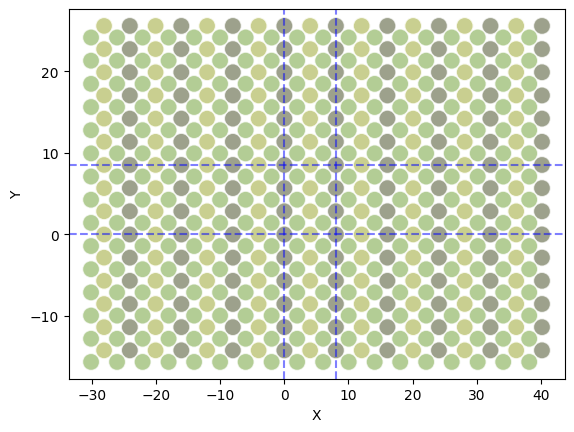

In [13]:
fig, ax = plt.subplots()
ax = canvas(canv, ax)
plt.show()

## Stick

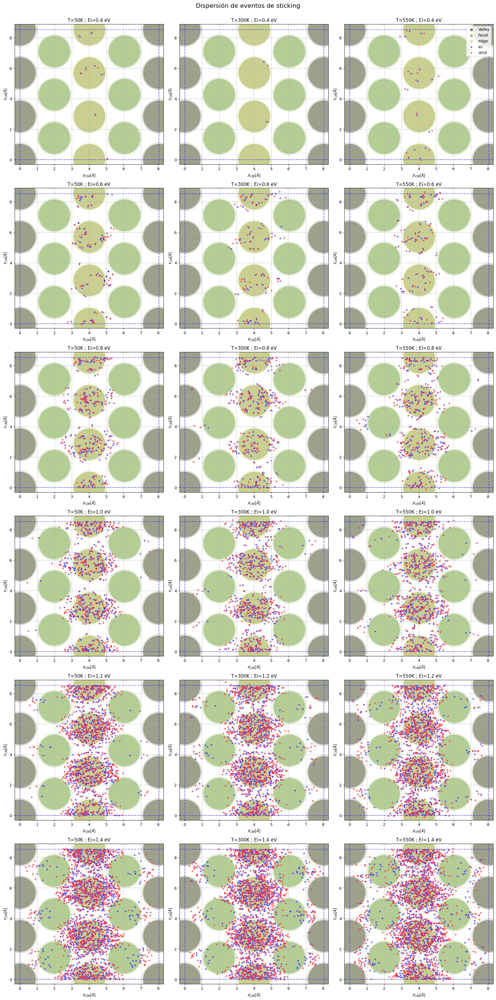

In [14]:
T = ['50','300','550']
fig, ax = plt.subplots(6,3, figsize=(18,36))
for i, CM_T in enumerate([CMs50,CMs300,CMs550]):
    for j,E in enumerate(E_incidencia2):
        df = CM_T[E]['stick']
        ax[j,i] = canvas_celda(canv, ax[j,i])
        sns.scatterplot(data = df,
                        x='x_ini',
                        y='y_ini',
                        label='ini',
                        alpha=0.6,
                        s=20,
                        color='blue',
                        ax=ax[j,i])
        sns.scatterplot(data = df,
                        x='x',
                        y='y',
                        label='stick',
                        alpha=0.6,
                        s=20,
                        color='red',
                        ax=ax[j,i])
        
        ax[j,i].set_xlabel('$X_{CM} [\AA]$')
        ax[j,i].set_ylabel('$Y_{CM} [\AA]$')
        ax[j,i].grid(linestyle='--')
        ax[j,i].legend().set_visible(False)
        ei =  E.replace('_','.')
        ax[j,i].set_title(f'T={T[i]}K ; Ei={ei} eV', fontsize=12)
        del(ei)
fig.suptitle('Dispersión de eventos de sticking', y=1.001, fontsize=16)
ax[0,2].legend(loc='upper right').set_visible(True)
fig.tight_layout()
plt.show()

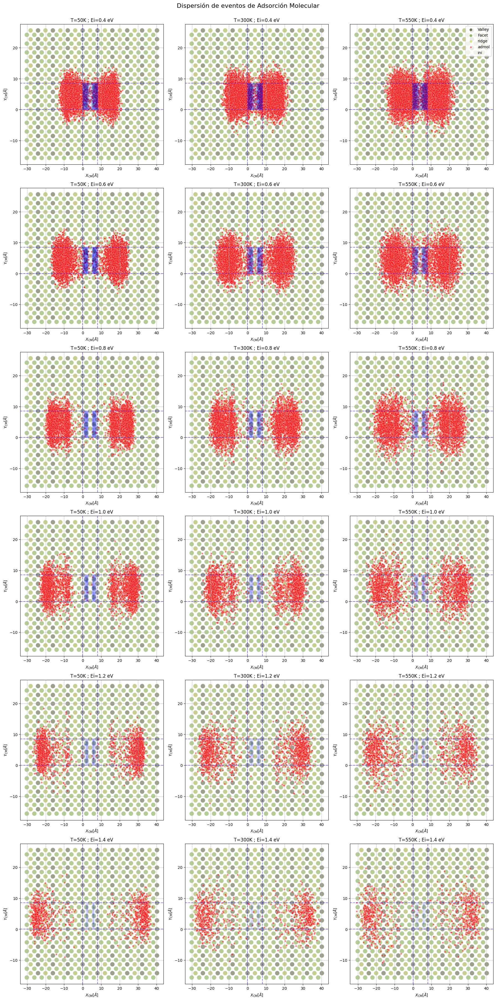

In [15]:
T = ['50','300','550']
fig, ax = plt.subplots(6,3, figsize=(18,36))
for i, CM_T in enumerate([CMs50,CMs300,CMs550]):
    for j,E in enumerate(E_incidencia2):
        df = CM_T[E]['admol']
        ax[j,i] = canvas(canv, ax[j,i])

        sns.scatterplot(data = df,
                        x='x',
                        y='y',
                        label='admol',
                        alpha=0.5,
                        s=20,
                        color='red',
                        ax=ax[j,i])
        sns.scatterplot(data = df,
                        x='x_ini',
                        y='y_ini',
                        label='ini',
                        alpha=0.01,
                        s=20,
                        color='blue',
                        ax=ax[j,i])        
        ax[j,i].set_xlabel('$X_{CM} [\AA]$')
        ax[j,i].set_ylabel('$Y_{CM} [\AA]$')
        ax[j,i].grid(linestyle='--')
        ax[j,i].legend().set_visible(False)
        ei =  E.replace('_','.')
        ax[j,i].set_title(f'T={T[i]}K ; Ei={ei} eV', fontsize=12)
        del(ei)
fig.suptitle('Dispersión de eventos de Adsorción Molecular', y=1.001, fontsize=16)
ax[0,2].legend(loc='upper right').set_visible(True)
fig.tight_layout()
plt.show()

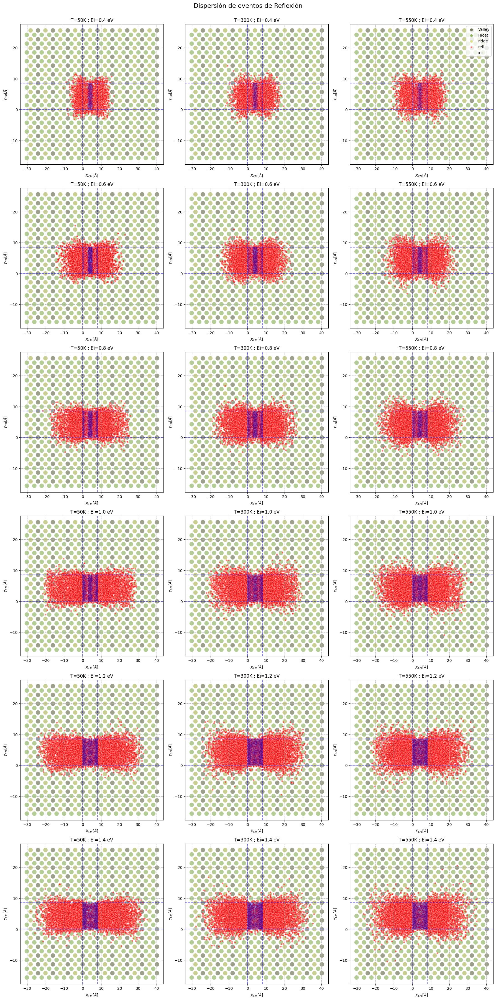

In [16]:
T = ['50','300','550']
fig, ax = plt.subplots(6,3, figsize=(18,36))
for i, CM_T in enumerate([CMs50,CMs300,CMs550]):
    for j,E in enumerate(E_incidencia2):
        df = CM_T[E]['refl']
        ax[j,i] = canvas(canv, ax[j,i])

        sns.scatterplot(data = df,
                        x='x',
                        y='y',
                        label='refl',
                        alpha=0.5,
                        s=20,
                        color='red',
                        ax=ax[j,i])
        sns.scatterplot(data = df,
                        x='x_ini',
                        y='y_ini',
                        label='ini',
                        alpha=0.01,
                        s=20,
                        color='blue',
                        ax=ax[j,i])
        
        ax[j,i].set_xlabel('$X_{CM} [\AA]$')
        ax[j,i].set_ylabel('$Y_{CM} [\AA]$')
        ax[j,i].grid(linestyle='--')
        ax[j,i].legend().set_visible(False)
        ei =  E.replace('_','.')
        ax[j,i].set_title(f'T={T[i]}K ; Ei={ei} eV', fontsize=12)
        del(ei)
fig.suptitle('Dispersión de eventos de Reflexión', y=1.001, fontsize=16)
ax[0,2].legend(loc='upper right').set_visible(True)
fig.tight_layout()
plt.show()

## Z_CM

In [17]:
T = ['550','300','50']
fig, ax = plt.subplots(3,6, figsize=(36,18),dpi=500)
for i, CM_T in enumerate([CMs550,CMs300,CMs50]):
    for j,E in enumerate(E_incidencia2):
        df = CM_T[E]['stick']
        sns.histplot(data = df,
                        x='z',
                        label='stick',
                        color='green',
                        alpha=0.6,
                        ax=ax[i,j])
        ax[i,j].axvline(x=df.z.median(), color='green',linestyle='--')
        ax[i,j].legend().set_visible(False)
        ax[i,j].set_title(f'T={T[i]}K ; Ei={E} eV')


        df = CM_T[E]['admol']
        sns.histplot(data = df,
                        x='z',
                        label='stick',
                        color='red',
                        alpha=0.6,
                        ax=ax[i,j])
        ax[i,j].axvline(x=df.z.median(), color='red',linestyle='--')
        ax[i,j].legend().set_visible(False)
        ax[i,j].set_title(f'T={T[i]}K ; Ei={E} eV')
plt.show()

In [18]:
T = ['550','300','50']
fig, ax = plt.subplots(3,6, figsize=(36,18),dpi=500)
for i, CM_T in enumerate([CMs550,CMs300,CMs50]):
    for j,E in enumerate(E_incidencia2):
        df = CM_T[E]['admol']
        sns.histplot(data = df,
                        x='z',
                        label='stick',
                        ax=ax[i,j])
        ax[i,j].axvline(x=df.z.median(), color='red',linestyle='--')
        ax[i,j].legend().set_visible(False)
        ax[i,j].set_title(f'T={T[i]}K ; Ei={E} eV')
plt.show()

## Desplazamiento del Pt sobre el cual ocurre la disociación

In [19]:
df = pd.merge(trajs550['1.4']['stick'],dPt550['1_4']['stick'], left_on=['ncoup', 'ptad'], right_on=['ntraj','nat'])
df

,ncoup,nt,t,nreb,nsubh,ptad,V,ntraj,nat,dx,dy,dz
0,20,940,0.1878,0,1,51,3.460459,20,51,-0.033498,0.100108,0.229183
1,31,828,0.1654,0,1,49,3.300459,31,49,0.118511,-0.127520,0.178753
2,34,871,0.1740,0,4,51,3.428598,34,51,-0.010161,0.491386,0.179224
3,37,922,0.1842,1,3,51,3.044614,37,51,0.016732,0.444947,0.160686
4,39,920,0.1838,0,3,51,3.386556,39,51,0.076705,-0.270381,0.041570
...,...,...,...,...,...,...,...,...,...,...,...,...
1214,9966,998,0.1994,1,4,51,3.587370,9966,51,-0.117910,-0.359715,0.122281
1215,9980,895,0.1788,1,1,50,3.367813,9980,50,-0.047303,0.277008,0.196774
1216,9988,907,0.1812,0,3,49,3.354040,9988,49,-0.001546,0.571940,0.085672
1217,9993,1000,0.1998,1,2,50,2.708475,9993,50,-0.180344,-0.004562,-0.004063


c:\Users\guill\anaconda3\envs\enviroment1\lib\site-packages\seaborn\categorical.py:3025: UserWarning: catplot is a figure-level function and does not accept target axes. You may wish to try stripplot
  warnings.warn(msg, UserWarning)


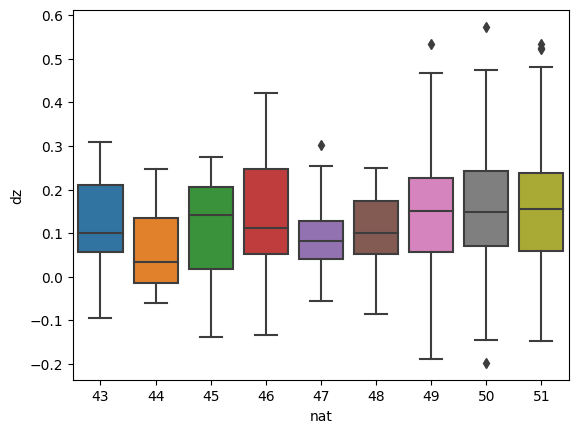

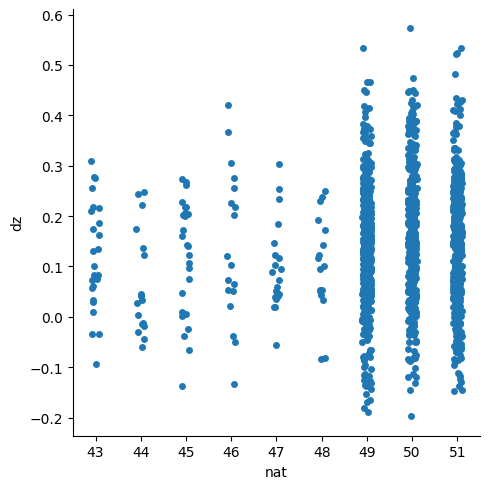

In [20]:
#sns.boxplot(data=df,x='nat', y='dz')
fig, ax = plt.subplots()
sns.boxplot(data=df,x='nat', y='dz',ax=ax)
sns.catplot(data=df,x='nat', y='dz',ax=ax)


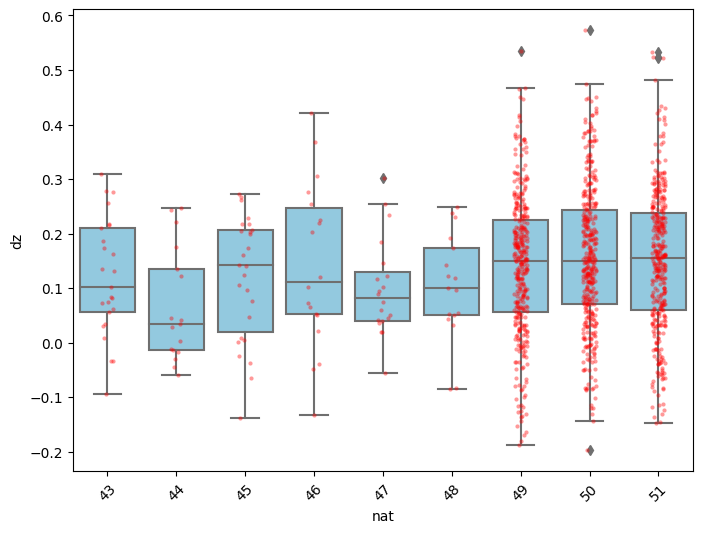

In [21]:
# Crea una figura y un eje
fig, ax = plt.subplots(figsize=(8, 6))

# Gráfico de caja y bigotes en el mismo eje
sns.boxplot(data=df, x='nat', y='dz', ax=ax, color='skyblue')

# Gráfico categórico superpuesto en el mismo eje
sns.stripplot(data=df, x='nat', y='dz', ax=ax, color='red', alpha=0.4, s= 3)

# Puedes ajustar el espaciado entre las categorías en el eje x, si es necesario
ax.set_xticklabels(ax.get_xticklabels(), rotation=45)  # Rotar las etiquetas del eje x

# Muestra la figura
plt.show()


In [22]:
T = ['550','300','50']
fig, ax = plt.subplots(3,6, figsize=(36,18),dpi=500)
for i, CM_T in enumerate([CMs550,CMs300,CMs50]):
    for j,E in enumerate(E_incidencia2):
        df = CM_T[E]['admol']
        sns.histplot(data = df,
                        x='z',
                        label='stick',
                        ax=ax[i,j])
        ax[i,j].axvline(x=df.z.median(), color='red',linestyle='--')
        ax[i,j].legend().set_visible(False)
        ax[i,j].set_title(f'T={T[i]}K ; Ei={E} eV')
plt.show()